In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
%cd {HOME}
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd {HOME}/GroundingDINO
!pip install -q -e .
!pip install -q roboflow

/content
Cloning into 'GroundingDINO'...
remote: Enumerating objects: 401, done.
remote: Counting objects: 100% (164/164), done.
remote: Compressing objects: 100% (44/44), done.
remote: Total 401 (delta 128), reused 120 (delta 120), pack-reused 237
Receiving objects: 100% (401/401), 12.84 MiB | 31.99 MiB/s, done.
Resolving deltas: 100% (205/205), done.
/content/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 20.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 23.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 47.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 32.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 53.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 61.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 23.4 MB/s eta 0:00:00
     ━━━━━━━━━━━

In [ ]:
import os

CONFIG_PATH = os.path.join(HOME, "GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py")
print(CONFIG_PATH, "; exist:", os.path.isfile(CONFIG_PATH))

/content/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py ; exist: True


## Download Grounding DINO Weights 🏋️

In [ ]:
%cd {HOME}
!mkdir {HOME}/weights
%cd {HOME}/weights

!wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

/content
/content/weights


In [ ]:
import os

WEIGHTS_NAME = "groundingdino_swint_ogc.pth"
WEIGHTS_PATH = os.path.join(HOME, "weights", WEIGHTS_NAME)
print(WEIGHTS_PATH, "; exist:", os.path.isfile(WEIGHTS_PATH))

/content/weights/groundingdino_swint_ogc.pth ; exist: True


## Download Example Data

In [ ]:
%cd {HOME}
!mkdir {HOME}/data
%cd {HOME}/data

!wget -q https://media.roboflow.com/notebooks/examples/dog.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-2.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-3.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-4.jpeg

/content
/content/data


## Load Grounding DINO Model

In [ ]:
%cd {HOME}/GroundingDINO

from groundingdino.util.inference import load_model, load_image, predict, annotate

model = load_model(CONFIG_PATH, WEIGHTS_PATH)

/content/GroundingDINO


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3526.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


final text_encoder_type: bert-base-uncased


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!7z x /content/drive/MyDrive/tasks.7z #предварительно загрузить архив на диск


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/drive/MyDrive/                                 1 file, 936187864 bytes (893 MiB)

Extracting archive: /content/drive/MyDrive/tasks.7z
--
Path = /content/drive/MyDrive/tasks.7z
Type = 7z
Physical Size = 936187864
Headers Size = 536637
Method = LZMA2:24
Solid = +
Blocks = 1

  0%      0% 504 - tasks/squirrels_head/00ffdbefc703471e.json                                                       0% 887 - tasks/squirrels_head/0713143a7c3d0c60.json                                                     

In [ ]:
import json
import os
import numpy as np
import cv2
import math
import datetime
import supervision as sv
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from glob import glob
from scipy.spatial import distance



In [ ]:
TASKS_DIR = '/content/GroundingDINO/tasks'

## Примеры работы сети на наших данных

distance: 0.017693670648517575


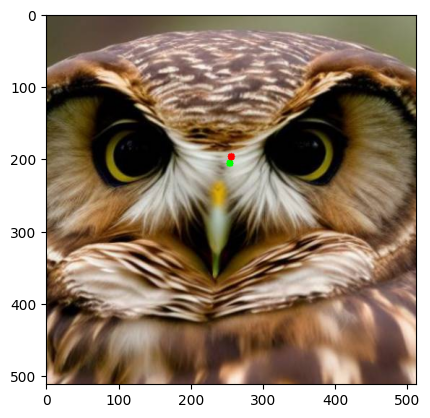

distance: 0.053460274686888215


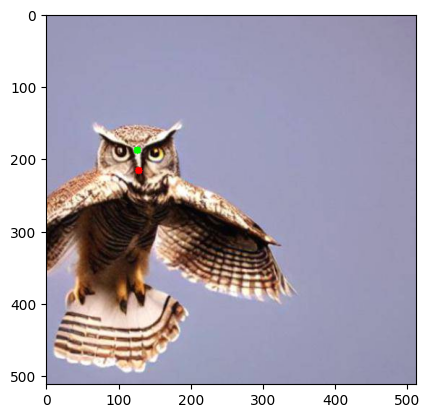

distance: 0.0033717921500500767


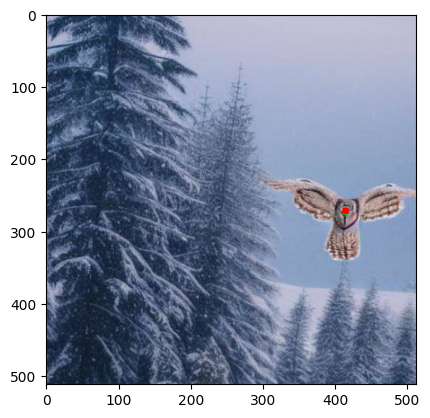

distance: 0.04006551986835125


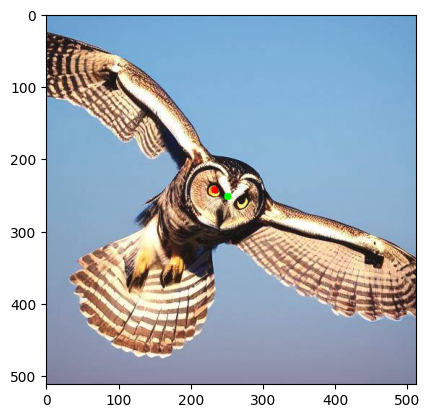

distance: 0.044508654863537354


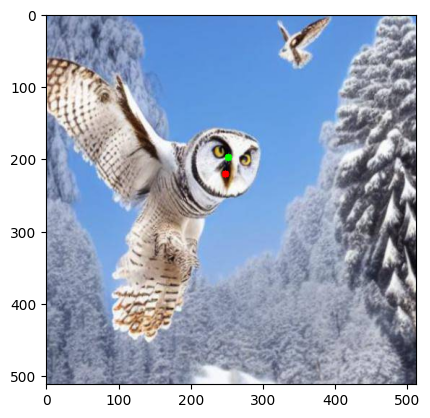

distance: 0.011103344266354275


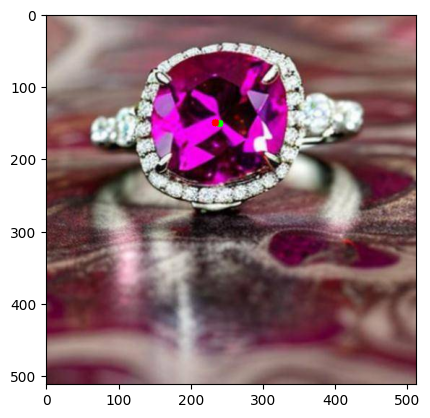

distance: 0.16601826078497856


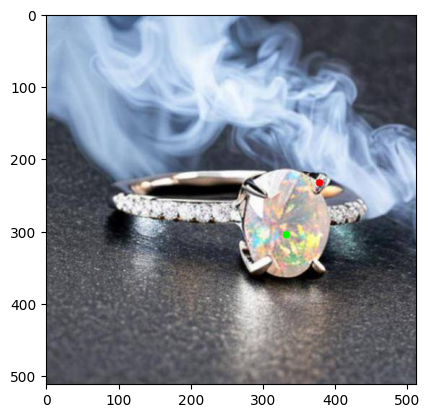

distance: 0.24093940857307863


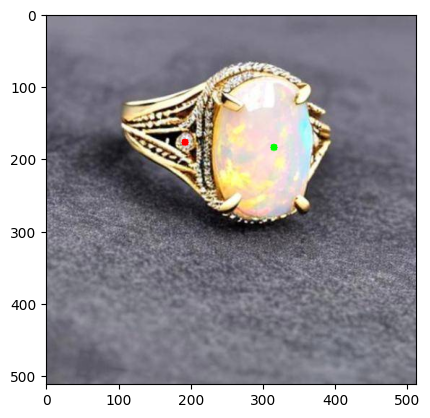

distance: 0.006030135376408953


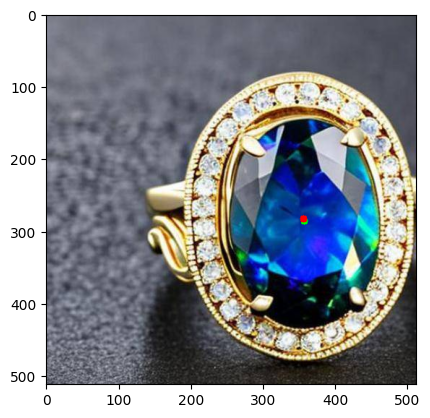

distance: 0.06712607814588414


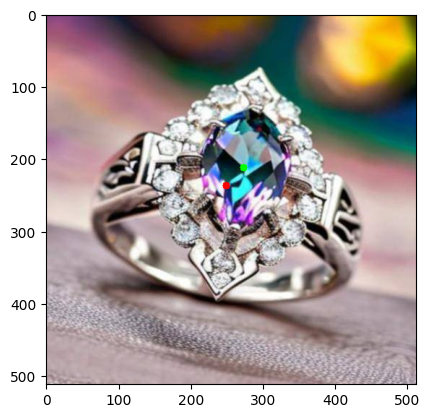

distance: 0.041806127235365746


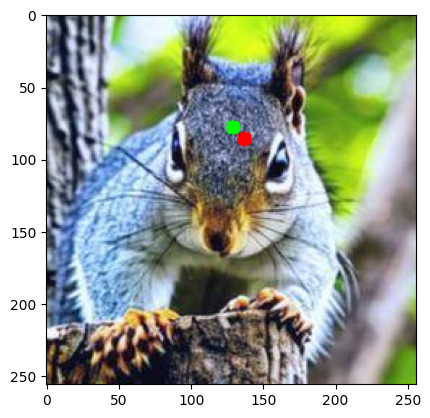

distance: 0.026405326767733456


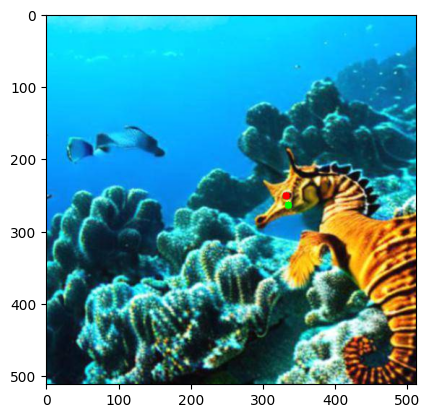

distance: 0.02593409310986238


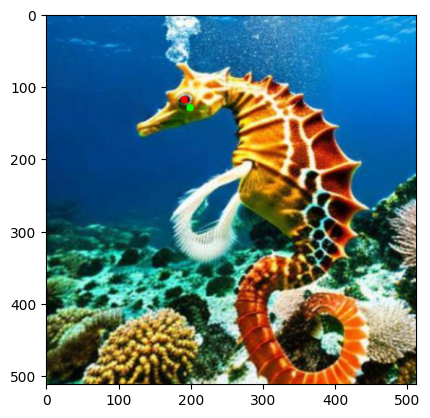

distance: 0.4379402160662996


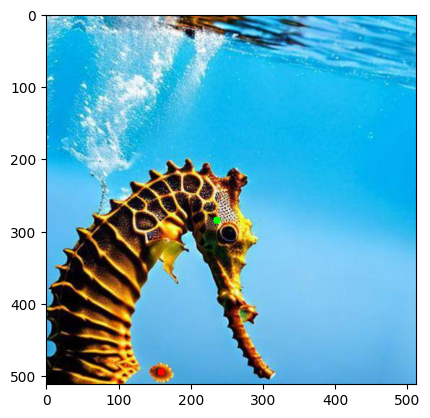

distance: 0.45463260828969837


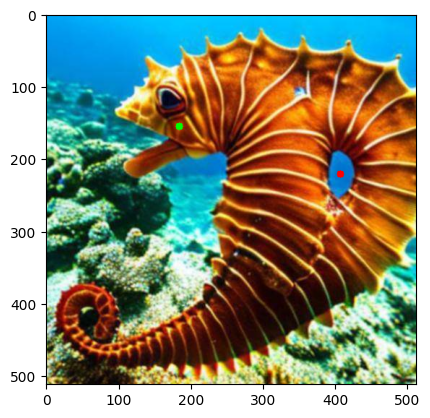

distance: 0.5153104452892624


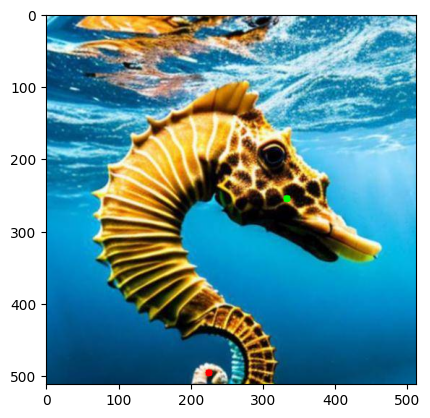

distance: 0.008179706272080825


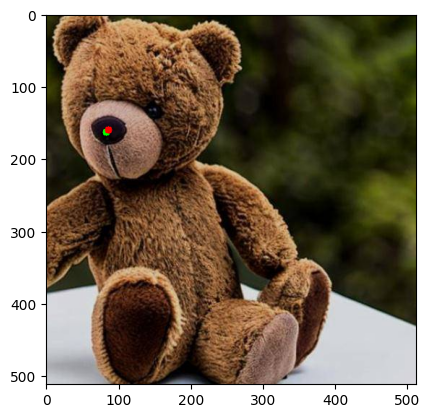

distance: 0.007090064743704822


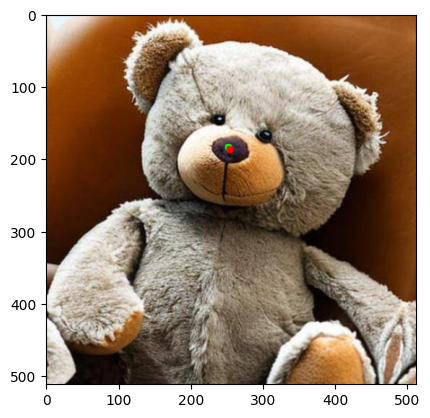

distance: 0.006553806312864667


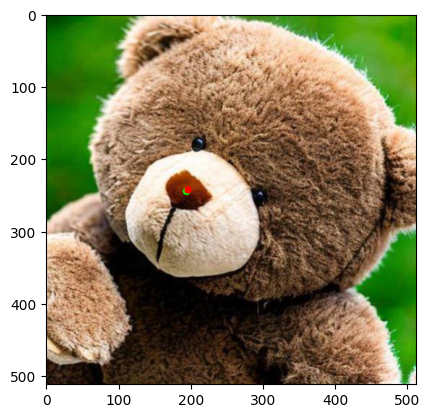

distance: 0.006556366403094998


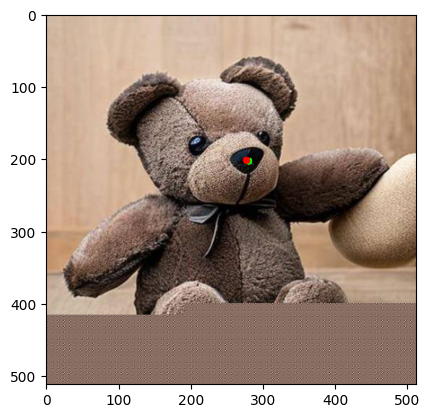

distance: 0.0029676876978861513


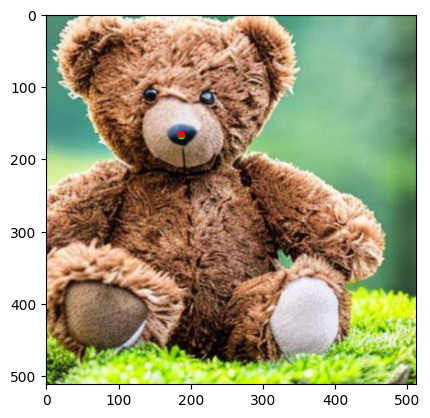

distance: 0.011175557596265704


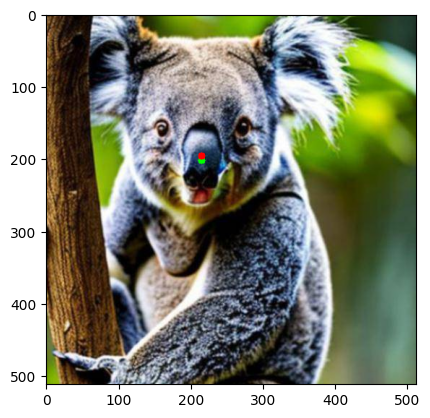

distance: 0.028861977202927838


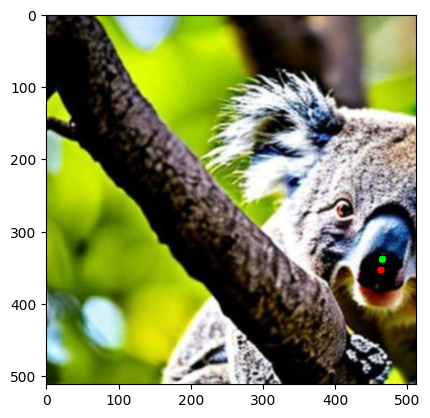

distance: 0.05304674893116619


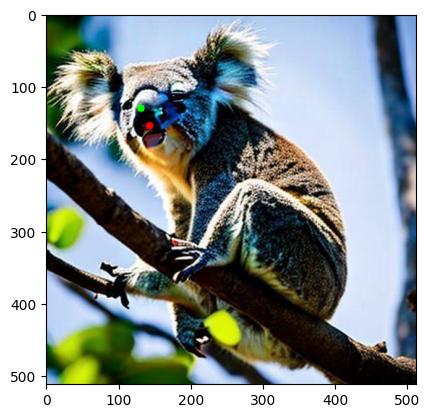

distance: 0.018060320453813006


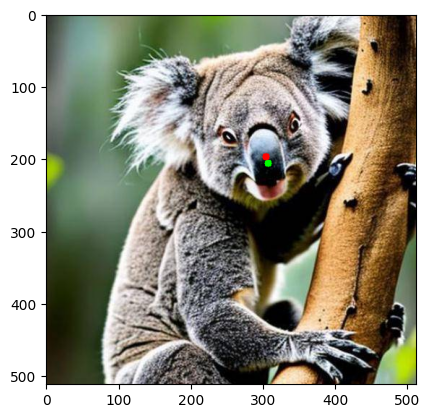

distance: 0.00401020127522456


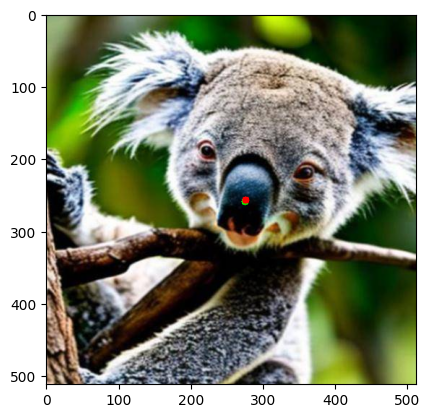

distance: 0.08635908370564774


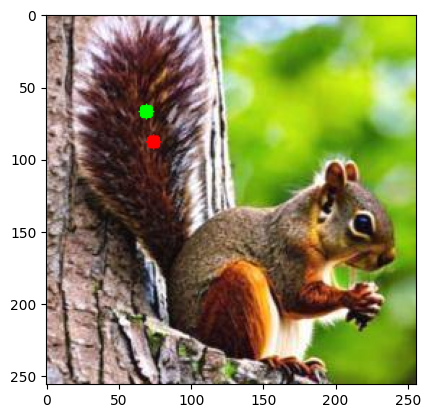

distance: 0.3728256328501686


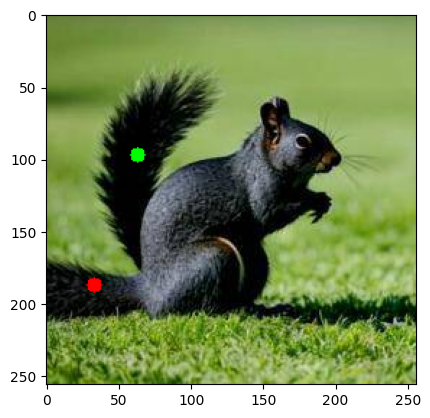

distance: 0.18358194416289608


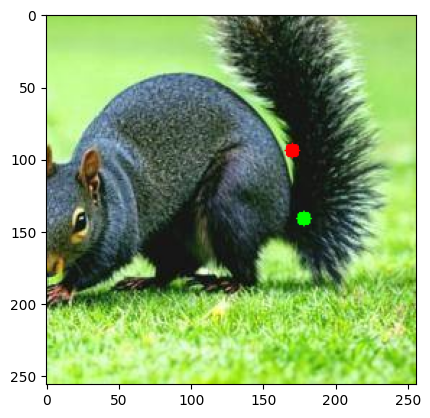

distance: 0.21373428139178868


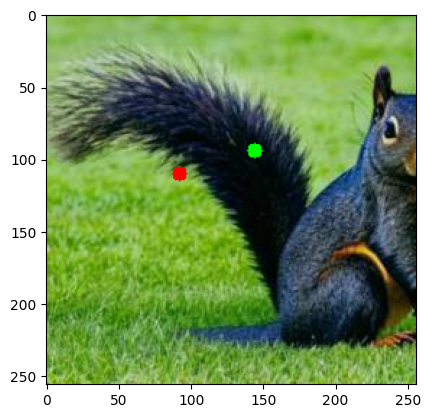

distance: 0.15590375528059006


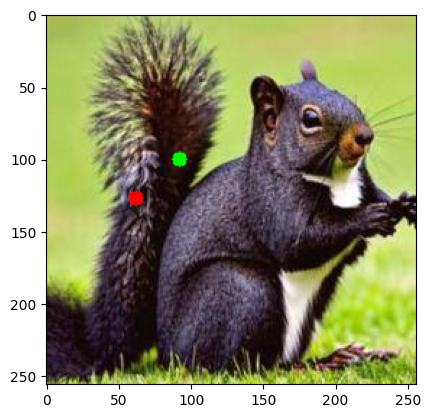

In [ ]:

BOX_TRESHOLD = 0.2
TEXT_TRESHOLD = 0.25

for task in os.listdir(TASKS_DIR):
  TEXT_PROMPT = task.replace('_', ' ')
  for img in glob(f"{os.path.join(TASKS_DIR,task)}/*.jpg")[:5]:

    json_path = img.replace(".jpg",".json")
    if os.stat(json_path).st_size > 2:
        data = json.load(open(json_path))
        gt_x, gt_y = data[0]['x'], data[0]['y']


        image_source, image = load_image(img)
        w,h  = image_source.shape[:2]

        boxes, logits, phrases = predict(
            model=model,
            image=image,
            caption=TEXT_PROMPT,
            box_threshold=BOX_TRESHOLD,
            text_threshold=TEXT_TRESHOLD
        )
        boxes_area = [elem[2]*elem[3] for elem in boxes.tolist()]
        box_idx = np.argmin(boxes_area)
        x_center, y_center = boxes.tolist()[box_idx][:2]
        dist = distance.euclidean((gt_x,gt_y), (x_center, y_center))
        print(f'distance: {dist}')



        cv2.circle(image_source, (int(gt_x*h),int(gt_y*w)), radius=5, color=(0, 255, 0), thickness=-1)
        cv2.circle(image_source, (int(x_center*h),int(y_center*w)), radius=5, color=(255, 0, 0), thickness=-1)
        plt.imshow(image_source)
        plt.show()


In [ ]:
start_time = datetime.datetime.now()


result = []
BOX_TRESHOLD = 0.2
TEXT_TRESHOLD = 0.25

for task in os.listdir(TASKS_DIR):
  TEXT_PROMPT = task.replace('_', ' ')
  for img in tqdm(glob(f"{os.path.join(TASKS_DIR,task)}/*.jpg")):

    json_path = img.replace(".jpg",".json")
    if os.stat(json_path).st_size > 2:
        data = json.load(open(json_path))
        gt_x, gt_y = data[0]['x'], data[0]['y']


        image_source, image = load_image(img)
        w,h  = image_source.shape[:2]

        boxes, logits, phrases = predict(
            model=model,
            image=image,
            caption=TEXT_PROMPT,
            box_threshold=BOX_TRESHOLD,
            text_threshold=TEXT_TRESHOLD,
            device='cuda'
        )

        boxes = boxes.tolist()

        try:
            boxes_area = [elem[2]*elem[3] for elem in boxes]
            box_idx = np.argmin(boxes_area)
            x_center, y_center = boxes[box_idx][:2]
            dist = distance.euclidean((gt_x,gt_y), (x_center, y_center))
            result.append(dist)
        except Exception as error:
            print(error)
            print(img)
script_time = datetime.datetime.now() - start_time


  0%|          | 0/1911 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/modeling_utils.py:907: FutureWarning: The `device` argument is deprecated and will be removed in v5 of Transformers.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:429: UserWarning: torch.utils.checkpoint: please pass in use_reentrant=True or use_reentrant=False explicitly. The default value of use_reentrant will be updated to be False in the future. To maintain current behavior, pass use_reentrant=True. It is recommended that you use use_reentrant=False. Refer to docs for more details on the differences between the two variants.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torch/utils/checkpoint.py:61: UserWarning: None of the inputs have requires_grad=True. Gradients will be None
  warnings.warn(


  0%|          | 0/4188 [00:00<?, ?it/s]

  0%|          | 0/9998 [00:00<?, ?it/s]

  0%|          | 0/4240 [00:00<?, ?it/s]

  0%|          | 0/4320 [00:00<?, ?it/s]

  0%|          | 0/3992 [00:00<?, ?it/s]

  0%|          | 0/1123 [00:00<?, ?it/s]

In [ ]:
result = np.array(result)
print(f'mean accuracy:{sum(result < 0.1) / len(result)}')
print(f'mean distance:{sum(result) / len(result)}')
print(f'script time: {script_time}')

mean accuracy:0.7844945194524157
mean distance:0.08299996827341194
script time: 1:39:50.636762
